In [2]:
import tensorflow as tf 
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.image as img
from tensorflow import keras
import tensorflow.keras.backend as K
from collections import defaultdict
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions
from tensorflow.keras.layers import Input, Dense, Dropout
import tensorflow_hub as hub
import cv2
import sys
sys.path.insert(0,'F:/Nilgai_photo_database/Nilgai Classifier/Nilgai/code')
sys.path.insert(0,'F:/Nilgai_photo_database/Nilgai Classifier/Nilgai/code/binary_class')


In [3]:
nilgai = 'C:/Users/ncu116/Desktop/nilgai.jpg'
pig = 'C:/Users/ncu116/Desktop/pig.jpg'
jag = 'C:/Users/ncu116/Desktop/jaguar.jpg'
nil_doe = 'C:/Users/ncu116/Desktop/nilgaidoe.jpg'
deer_doe = 'C:/Users/ncu116/Desktop/deerdoe.jpg'

In [4]:
model = InceptionV3(weights='imagenet', include_top=True)
layers = [layer.output for layer in model.layers[:]]
# list number of layers
print("Number of total Layers: ", len(model.layers))
print()
# summarize feature map shapes
model_index = []
layer_names = []
layer_shape=[]
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
        # summarize output shape
    model_index.append(i)
    layer_names.append(layer.name)
    layer_shape.append(layer.output_shape)

    print(i, layer.name, layer.output.shape)
print(len(model_index))
model.summary()

Number of total Layers:  313

1 conv2d (None, 149, 149, 32)
4 conv2d_1 (None, 147, 147, 32)
7 conv2d_2 (None, 147, 147, 64)
11 conv2d_3 (None, 73, 73, 80)
14 conv2d_4 (None, 71, 71, 192)
18 conv2d_8 (None, 35, 35, 64)
21 conv2d_6 (None, 35, 35, 48)
22 conv2d_9 (None, 35, 35, 96)
28 conv2d_5 (None, 35, 35, 64)
29 conv2d_7 (None, 35, 35, 64)
30 conv2d_10 (None, 35, 35, 96)
31 conv2d_11 (None, 35, 35, 32)
41 conv2d_15 (None, 35, 35, 64)
44 conv2d_13 (None, 35, 35, 48)
45 conv2d_16 (None, 35, 35, 96)
51 conv2d_12 (None, 35, 35, 64)
52 conv2d_14 (None, 35, 35, 64)
53 conv2d_17 (None, 35, 35, 96)
54 conv2d_18 (None, 35, 35, 64)
64 conv2d_22 (None, 35, 35, 64)
67 conv2d_20 (None, 35, 35, 48)
68 conv2d_23 (None, 35, 35, 96)
74 conv2d_19 (None, 35, 35, 64)
75 conv2d_21 (None, 35, 35, 64)
76 conv2d_24 (None, 35, 35, 96)
77 conv2d_25 (None, 35, 35, 64)
87 conv2d_27 (None, 35, 35, 64)
90 conv2d_28 (None, 35, 35, 96)
93 conv2d_26 (None, 17, 17, 384)
94 conv2d_29 (None, 17, 17, 96)
101 conv2d_34 (No

In [5]:
layer_outputs = [layer.output for layer in model.layers[0:-1]]
test_image = nilgai
images_per_row = 16
IMG_SIZE = (299,299)
img = image.load_img(test_image, target_size=(IMG_SIZE[0], IMG_SIZE[1]))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.

In [6]:
activation_model = tf.keras.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)
len(activations)
model.summary()
for i, n in zip(model_index, layer_names):
    print(i, n)

UnknownError:  Failed to get convolution algorithm. This is probably because cuDNN failed to initialize, so try looking to see if a warning log message was printed above.
	 [[node model/conv2d/Conv2D (defined at <ipython-input-6-b9d51289161b>:2) ]] [Op:__inference_predict_function_12458]

Function call stack:
predict_function


In [6]:
plot_layer_names = ['conv2d', 'conv2d_2 ', 'conv2d_9  ','conv2d_11 ','conv2d_18 ','conv2d_25 ','conv2d_29 ','conv2d_39 ','conv2d_49 ']
# layer_names = ['concatenate', 'concatenate_1']
# activ_list = [activations[277],activations[308]]
activ_list = [activations[1],activations[7], activations[22],activations[31], activations[54],activations[77], activations[94],activations[123], activations[155]]

len(layer_names)

94

In [11]:
for layer_name, layer_activation in zip(plot_layer_names, activ_list):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    scale = .5 / size
    # plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    # plt.figure()
    # plt.title(layer_name)
    # plt.grid(False)
    # plt.imshow(display_grid, aspect='auto', cmap='gray')
    # plt.savefig(str(layer_name)+"_grid.jpg", bbox_inches='tight')

In [12]:
for i, n in zip(model_index, layer_names):
    print(i, n)
# model.summary()

1 conv2d
4 conv2d_1
7 conv2d_2
11 conv2d_3
14 conv2d_4
18 conv2d_8
21 conv2d_6
22 conv2d_9
28 conv2d_5
29 conv2d_7
30 conv2d_10
31 conv2d_11
41 conv2d_15
44 conv2d_13
45 conv2d_16
51 conv2d_12
52 conv2d_14
53 conv2d_17
54 conv2d_18
64 conv2d_22
67 conv2d_20
68 conv2d_23
74 conv2d_19
75 conv2d_21
76 conv2d_24
77 conv2d_25
87 conv2d_27
90 conv2d_28
93 conv2d_26
94 conv2d_29
101 conv2d_34
104 conv2d_35
107 conv2d_31
108 conv2d_36
113 conv2d_32
114 conv2d_37
120 conv2d_30
121 conv2d_33
122 conv2d_38
123 conv2d_39
133 conv2d_44
136 conv2d_45
139 conv2d_41
140 conv2d_46
145 conv2d_42
146 conv2d_47
152 conv2d_40
153 conv2d_43
154 conv2d_48
155 conv2d_49
165 conv2d_54
168 conv2d_55
171 conv2d_51
172 conv2d_56
177 conv2d_52
178 conv2d_57
184 conv2d_50
185 conv2d_53
186 conv2d_58
187 conv2d_59
197 conv2d_64
200 conv2d_65
203 conv2d_61
204 conv2d_66
209 conv2d_62
210 conv2d_67
216 conv2d_60
217 conv2d_63
218 conv2d_68
219 conv2d_69
229 conv2d_72
232 conv2d_73
235 conv2d_70
236 conv2d_74
241 conv2

Text(0.5, 1.0, 'conv2d_21')

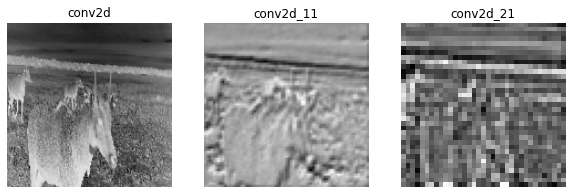

In [13]:
first_convlayer_activation = activations[1]
second_convlayer_activation = activations[11]
third_convlayer_activation = activations[21]
fourth_convlayer_activation = activations[30]
fifth_convlayer_activation = activations[51]
sixth_convlayer_activation = activations[87]
seventh_convlayer_activation = activations[108]
eigth_convlayer_activation = activations[139]
ninth_convlayer_activation = activations[186]
f,ax = plt.subplots(1,3, figsize=(10,6))
ax[0].imshow(first_convlayer_activation[0, :, :, 3], cmap='gray')
ax[0].axis('OFF')
ax[0].set_title('conv2d')
ax[1].imshow(second_convlayer_activation[0, :, :, 3], cmap='gray')
ax[1].axis('OFF')
ax[1].set_title('conv2d_11')
ax[2].imshow(third_convlayer_activation[0, :, :, 3], cmap='gray')
ax[2].axis('OFF')
ax[2].set_title('conv2d_21')


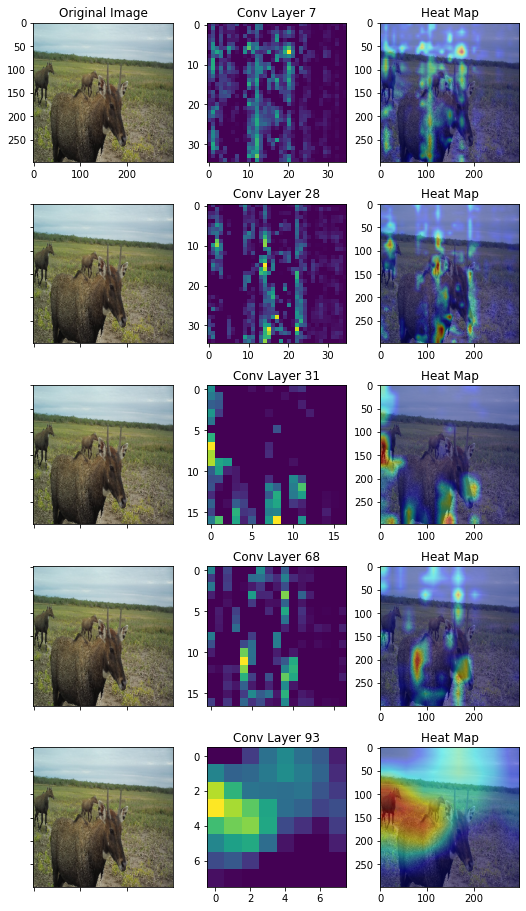

In [14]:
nilgai = 'C:/Users/ncu116/Desktop/nilgai.jpg'
pig = 'C:/Users/ncu116/Desktop/pig.jpg'
pigs = 'C:/Users/ncu116/Desktop/pigs.jpg'
jag = 'C:/Users/ncu116/Desktop/jaguar.jpg'
nil_doe = 'C:/Users/ncu116/Desktop/nilgaidoe.jpg'
deer_doe = 'C:/Users/ncu116/Desktop/deerdoe.jpg'
bird = 'C:/Users/ncu116/Desktop/bird.jpg'
bird2 = 'C:/Users/ncu116/Desktop/2bird.jpg'
buck = 'C:/Users/ncu116/Desktop/buck.jpg'

test_image = nilgai
cv2_cmap = cv2.COLORMAP_JET  
plt_cmap = 'viridis'

layer1 = ['conv2d_7', (35,35)]
layer2 = ['conv2d_28', (35,35)]
layer3 = ['conv2d_31', (17,17)]
layer4 = ['conv2d_68', (17,17)] # 73, 70, 
layer5 = ['conv2d_93', (8,8)]

# create title for each feature map
layers_list = [layer1, layer2, layer3, layer4, layer5]
layer_titles = []
for layer in np.array(layers_list)[:,0]:
    title = 'Conv Layer ' + layer.split('_')[1] 
    layer_titles.append(title)


img = image.load_img(test_image, target_size=(299, 299))
img = image.img_to_array(img)
orig_img = image.img_to_array(img)
orig_img = img/255. 

f,ax = plt.subplots(5,3, figsize=(24,24))
ax[0,0].imshow(orig_img)
ax[0,0].set_title("Original Image")

ax[1,0].imshow(orig_img)
ax[1,0].set_xticklabels([""])
ax[1,0].set_yticklabels([""])

ax[2,0].imshow(orig_img)
ax[2,0].set_xticklabels([""])
ax[2,0].set_yticklabels([""])

ax[3,0].imshow(orig_img)
ax[3,0].set_xticklabels([""])
ax[3,0].set_yticklabels([""])

ax[4,0].imshow(orig_img)
ax[4,0].set_xticklabels([""])
ax[4,0].set_yticklabels([""])
    
img = np.expand_dims(img, axis=0)
img = preprocess_input(img) 
# img = img/255.
    
preds = model.predict(img)
###########################################################################################
## 1
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer1[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer1[1])
ax[0,1].imshow(heatmap,cmap=plt_cmap)
ax[0,1].set_title(layer_titles[0])


act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[0,2].imshow(img_act)
ax[0,2].set_title("Heat Map")
###########################################################################################
## 2
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer2[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer2[1])
ax[1,1].imshow(heatmap,cmap=plt_cmap)
ax[1,1].set_title(layer_titles[1])

act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[1,2].imshow(img_act)
ax[1,2].set_title("Heat Map")

###########################################################################################
## 3
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer3[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer3[1])
ax[2,1].imshow(heatmap, cmap=plt_cmap)
ax[2,1].set_title(layer_titles[2])

act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[2,2].imshow(img_act)
ax[2,2].set_title("Heat Map")

###########################################################################################
## 4

with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer4[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer4[1])
ax[3,1].imshow(heatmap, cmap=plt_cmap)
ax[3,1].set_title(layer_titles[3])


act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[3,2].imshow(img_act)
ax[3,2].set_title("Heat Map")
ax[3,1].set_xticklabels([""])

###########################################################################################

## 5

with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer5[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer5[1])
ax[4,1].imshow(heatmap, cmap=plt_cmap)
ax[4,1].set_title(layer_titles[4])


act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[4,2].imshow(img_act)
ax[4,2].set_title("Heat Map")

###########################################################################################
plt.subplots_adjust(wspace=0.01, hspace=0.3, left=0, right=0.3, bottom=0.5, top=1)
plt.show()

In [15]:

for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
        # summarize output shape
    model_index.append(i)
    layer_names.append(layer.name)
    layer_shape.append(layer.output_shape)

    print(i, layer.name, layer.output.shape)

1 conv2d (None, 149, 149, 32)
4 conv2d_1 (None, 147, 147, 32)
7 conv2d_2 (None, 147, 147, 64)
11 conv2d_3 (None, 73, 73, 80)
14 conv2d_4 (None, 71, 71, 192)
18 conv2d_8 (None, 35, 35, 64)
21 conv2d_6 (None, 35, 35, 48)
22 conv2d_9 (None, 35, 35, 96)
28 conv2d_5 (None, 35, 35, 64)
29 conv2d_7 (None, 35, 35, 64)
30 conv2d_10 (None, 35, 35, 96)
31 conv2d_11 (None, 35, 35, 32)
41 conv2d_15 (None, 35, 35, 64)
44 conv2d_13 (None, 35, 35, 48)
45 conv2d_16 (None, 35, 35, 96)
51 conv2d_12 (None, 35, 35, 64)
52 conv2d_14 (None, 35, 35, 64)
53 conv2d_17 (None, 35, 35, 96)
54 conv2d_18 (None, 35, 35, 64)
64 conv2d_22 (None, 35, 35, 64)
67 conv2d_20 (None, 35, 35, 48)
68 conv2d_23 (None, 35, 35, 96)
74 conv2d_19 (None, 35, 35, 64)
75 conv2d_21 (None, 35, 35, 64)
76 conv2d_24 (None, 35, 35, 96)
77 conv2d_25 (None, 35, 35, 64)
87 conv2d_27 (None, 35, 35, 64)
90 conv2d_28 (None, 35, 35, 96)
93 conv2d_26 (None, 17, 17, 384)
94 conv2d_29 (None, 17, 17, 96)
101 conv2d_34 (None, 17, 17, 128)
104 conv2d_35

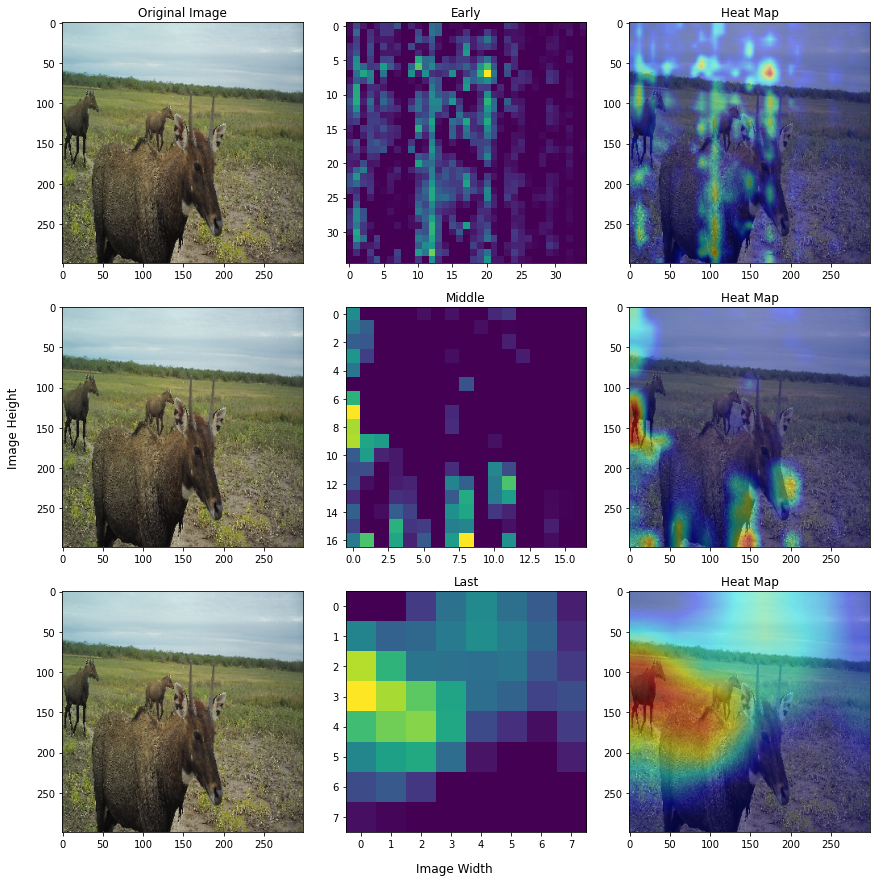

In [16]:
nilgai = 'C:/Users/ncu116/Desktop/nilgai.jpg'
pig = 'C:/Users/ncu116/Desktop/pig.jpg'
pigs = 'C:/Users/ncu116/Desktop/pigs.jpg'
jag = 'C:/Users/ncu116/Desktop/jaguar.jpg'
nil_doe = 'C:/Users/ncu116/Desktop/nilgaidoe.jpg'
deer_doe = 'C:/Users/ncu116/Desktop/deerdoe.jpg'
bird = 'C:/Users/ncu116/Desktop/bird.jpg'
bird2 = 'C:/Users/ncu116/Desktop/2bird.jpg'
buck = 'C:/Users/ncu116/Desktop/buck.jpg'

test_image = nilgai
cv2_cmap = cv2.COLORMAP_JET  
plt_cmap = 'viridis'

layer1 = ['conv2d_7', (35,35)]
layer2 = ['conv2d_31', (17,17)]
layer3 = ['conv2d_93', (8,8)]


# create title for each feature map
layers_list = [layer1, layer2, layer3, layer4, layer5]
layer_titles = ['Early', 'Middle', 'Last']

img = image.load_img(test_image, target_size=(299, 299))
img = image.img_to_array(img)
orig_img = image.img_to_array(img)
orig_img = img/255. 

f,ax = plt.subplots(3,3, figsize=(12,12))
ax[0,0].imshow(orig_img)
ax[0,0].set_title("Original Image")

ax[1,0].imshow(orig_img)
# ax[1,0].set_xticklabels([""])
# ax[1,0].set_yticklabels([""])

ax[2,0].imshow(orig_img)
# ax[2,0].set_xticklabels([""])
# ax[2,0].set_yticklabels([""])

img = np.expand_dims(img, axis=0)
img = preprocess_input(img) 
# img = img/255.
    
preds = model.predict(img)
###########################################################################################
## 1
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer1[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer1[1])
ax[0,1].imshow(heatmap,cmap=plt_cmap)
ax[0,1].set_title(layer_titles[0])


act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[0,2].imshow(img_act)
ax[0,2].set_title("Heat Map")
###########################################################################################
## 2
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer2[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer2[1])
ax[1,1].imshow(heatmap,cmap=plt_cmap)
ax[1,1].set_title(layer_titles[1])

act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[1,2].imshow(img_act)
ax[1,2].set_title("Heat Map")

###########################################################################################
## 3
with tf.GradientTape() as tape:
    last_conv_layer = model.get_layer(layer3[0])
    iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
    model_out, last_conv_layer = iterate(img)
    class_out = model_out[:, np.argmax(model_out[0])]
    grads = tape.gradient(class_out, last_conv_layer)
pooled_grads = K.mean(grads, axis=(0, 1))

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape(layer3[1])
ax[2,1].imshow(heatmap, cmap=plt_cmap)
ax[2,1].set_title(layer_titles[2])

act_img = cv2.imread(test_image)
heatmap = cv2.resize(heatmap, (act_img.shape[1], act_img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2_cmap)
superimposed = cv2.addWeighted(act_img, 0.6, heatmap, 0.4, 0)
cv2.imwrite('classactivation.png', superimposed)
img_act = image.load_img('classactivation.png', target_size=(299, 299))
ax[2,2].imshow(img_act)
ax[2,2].set_title("Heat Map")

###########################################################################################
f.tight_layout()
f.text(-.01, 0.5, "Image Height", rotation='vertical', horizontalalignment='center', verticalalignment='center', fontsize=12, fontweight='medium')
f.text(.5,-.01, "Image Width", rotation='horizontal', horizontalalignment='center', verticalalignment='center', fontsize=12, fontweight='medium')
plt.show()

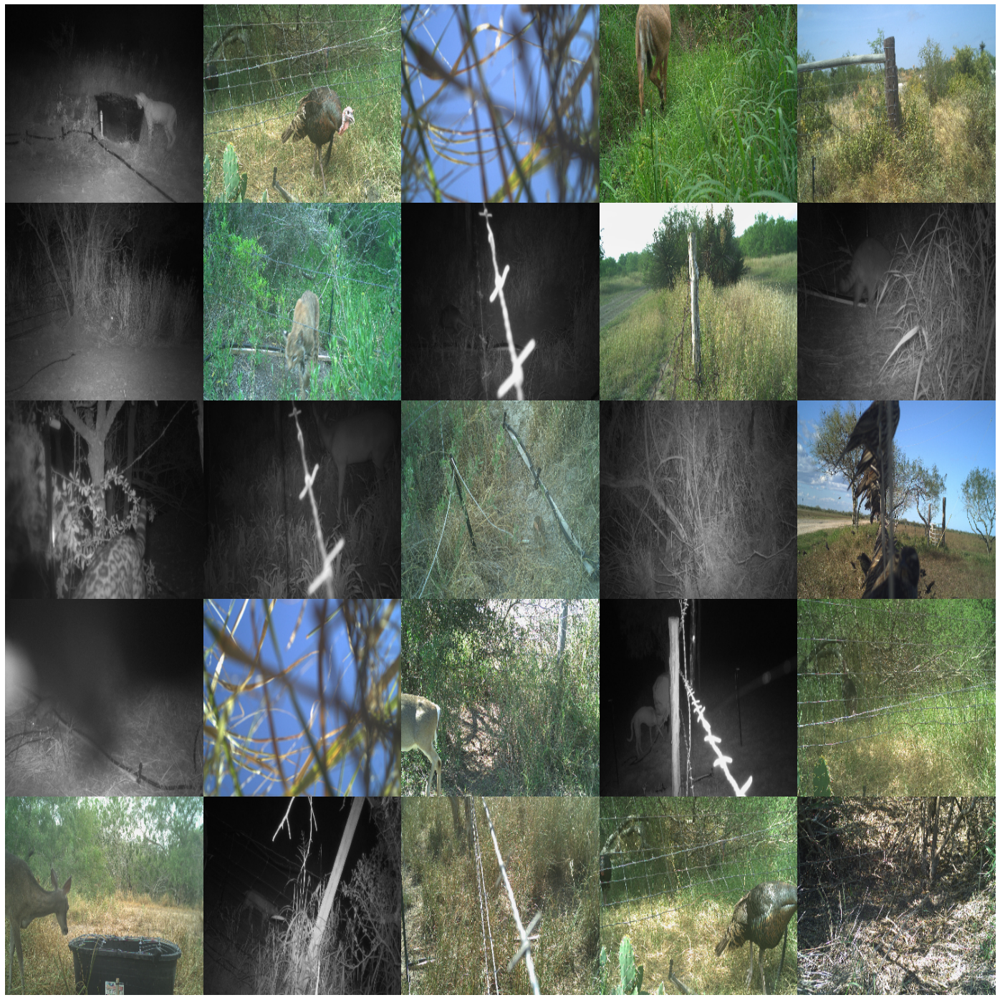

In [28]:
import matplotlib.pyplot as plt
import matplotlib.colors
import matplotlib.cm
import numpy as np
df = pd.read_csv(r'F:\Nilgai_photo_database\Nilgai Classifier\Nilgai\data\example_1K_multi_data.csv')
df = df.sample(n=25)

img_list = []
for row in df.itertuples():
    img = cv2.imread(row.IMGPATH)
    newimage = cv2.resize(img,(299,299))
    crop_img = newimage[10:282, 0:299] # Crop from {x, y, w, h } => {0, 0, 300, 400}
    newimage = cv2.resize(crop_img,(299,299))
    # plt.axis("off")
    # plt.imshow(cv2.cvtColor(newimage, cv2.COLOR_BGR2RGB))
    img_list.append(newimage)

aspect = 1.
n = 5 # number of rows
m = 5 # numberof columns
bottom = 0.1; left=0.05
top=1.-bottom; right = 1.-0.18
fisasp = (1-bottom-(1-top))/float( 1-left-(1-right) )
#widthspace, relative to subplot size
wspace=0  # set to zero for no spacing
hspace=wspace/float(aspect)
#fix the figure height
figheight= 24 # inch
figwidth = (m + (m-1)*wspace)/float((n+(n-1)*hspace)*aspect)*figheight*fisasp

fig, axes = plt.subplots(nrows=n, ncols=m, figsize=(figwidth, figheight))
plt.subplots_adjust(top=top, bottom=bottom, left=left, right=right, 
                    wspace=wspace, hspace=hspace)

for i, ax in enumerate(axes.flatten()):
    ax.imshow(cv2.cvtColor(img_list[i], cv2.COLOR_BGR2RGB))
    ax.axis('off')


plt.show()

## ML Mastery Tutorial

In [30]:
# define original model
model = InceptionV3(weights='imagenet')

In [ ]:
# list number of layers
print("Number of total Layers: ", len(model.layers))
print()
# summarize feature map shapes
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'mix' not in layer.name:
        continue
        # summarize output shape
    print(i, layer.name, layer.output.shape)

In [139]:
lyr_names = [model.layers[x].name for x in range(len(model.layers))]
# lyr_names
model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d_94 (Conv2D)              (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_94 (BatchNo (None, 149, 149, 32) 96          conv2d_94[0][0]                  
__________________________________________________________________________________________________
activation_94 (Activation)      (None, 149, 149, 32) 0           batch_normalization_94[0][0]     
_______________________________________________________________________________________

In [143]:
# redefine model to output right after the first hidden layer
re_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[311].output)

In [145]:
# define test image
test_image = nilgai
# load the image with the required shape
img = image.load_img(test_image, target_size=(299, 299))
# convert the image to an array
img = image.img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = np.expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = re_model.predict(img)
print(feature_maps.shape)

(1, 2048)


Text(0.5, 1.0, 'Original Image')

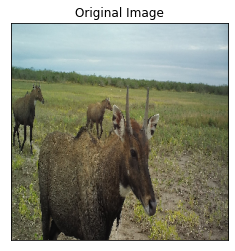

In [146]:
# load the image with the required shape
orig_img = image.load_img(test_image, target_size=(299, 299))
# create copy for original image imshow
orig_img = image.img_to_array(orig_img)
# rescale manually to show image
orig_img = orig_img/255. 

# create plot for original test image
f,ax = plt.subplots(figsize=(6,4))
ax.imshow(orig_img)
ax.set_xticks([])
ax.set_yticks([])
ax.set_title("Original Image")

In [149]:
aspect = 1.
n = 1 # number of rows
m = 2048 # numberof columns
bottom = 0.1; left=0.05
top=1.-bottom; right = 1.-0.18
fisasp = (1-bottom-(1-top))/float( 1-left-(1-right) )
#widthspace, relative to subplot size
wspace=0.01  # set to zero for no spacing
hspace=wspace/float(aspect)
#fix the figure height
figheight=4 # inch
figwidth = (m + (m-1)*wspace)/float((n+(n-1)*hspace)*aspect)*figheight*fisasp

fig, axes = plt.subplots(nrows=n, ncols=m, figsize=(figwidth, figheight))

plt.subplots_adjust(top=top, bottom=bottom, left=left, right=right, 
                    wspace=wspace, hspace=hspace)

for i, ax in enumerate(axes.flatten()):
	ax = plt.subplot(1, 2048, i+1)
# for _ in range(square):
	for _ in range(square):
		# specify subplot and turn of axis
		ax.set_xticks([])
		ax.set_yticks([])
		# plot filter channel in grayscale
		plt.imshow(feature_maps[0, :, :, i-1], cmap='viridis')
		ax.axis('off')

plt.show()

KeyboardInterrupt: 

In [119]:
# list number of layers
print("Number of total Layers: ", len(model.layers))
print()
# summarize feature map shapes
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'pool' not in layer.name:
        continue
        # summarize output shape
    print(i, layer.name, layer.output.shape)

Number of total Layers:  313

10 max_pooling2d (None, 73, 73, 64)
17 max_pooling2d_1 (None, 35, 35, 192)
27 average_pooling2d (None, 35, 35, 192)
50 average_pooling2d_1 (None, 35, 35, 256)
73 average_pooling2d_2 (None, 35, 35, 288)
99 max_pooling2d_2 (None, 17, 17, 288)
119 average_pooling2d_3 (None, 17, 17, 768)
151 average_pooling2d_4 (None, 17, 17, 768)
183 average_pooling2d_5 (None, 17, 17, 768)
215 average_pooling2d_6 (None, 17, 17, 768)
247 max_pooling2d_3 (None, 8, 8, 768)
262 average_pooling2d_7 (None, 8, 8, 1280)
293 average_pooling2d_8 (None, 8, 8, 2048)
311 avg_pool (None, 2048)


In [120]:
# redefine model to output right after the first hidden layer
# ixs = [40, 63,86, 100,132,164,196, 228,248,276,279,307, 310]
ixs = [10 ,17 ,27 ,50 ,73 ,99,119 ,151 , 277 , 308 ]
outputs = [model.layers[i+1].output for i in ixs]
multi_model = tf.keras.Model(inputs=model.inputs, outputs=outputs)
multi_model.summary()

Model: "model_75"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 299, 299, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 149, 149, 32) 96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 149, 149, 32) 0           batch_normalization[0][0]        
___________________________________________________________________________________________

In [125]:
# define test image
test_image = pigs
# load the image with the required shape
img = image.load_img(test_image, target_size=(299, 299))
# convert the image to an array
img = image.img_to_array(img)
# expand dimensions so that it represents a single 'sample'
img = np.expand_dims(img, axis=0)
# prepare the image (e.g. scale pixel values for the vgg)
img = preprocess_input(img)
# get feature map for first hidden layer
feature_maps = multi_model.predict(img)
# activ_list = [activations[0], activations[1],activations[2], activations[3],activations[4], activations[5],activations[6], activations[7],activations[8], activations[9]]
# print(feature_maps)

In [29]:

# plot the output from each block
square = 5
for fmap in feature_maps:
    plt.subplots(figsize=(24,24))
    # plot all 64 maps in an 8x8 squares
    ix = 1
    for _ in range(square):
        for _ in range(square):
            # specify subplot and turn of axis
            ax = plt.subplot(square, square, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(fmap[0, :, :, ix-1], cmap='viridis')
            ix += 1
        # show the figure
    plt.show()


NameError: name 'feature_maps' is not defined